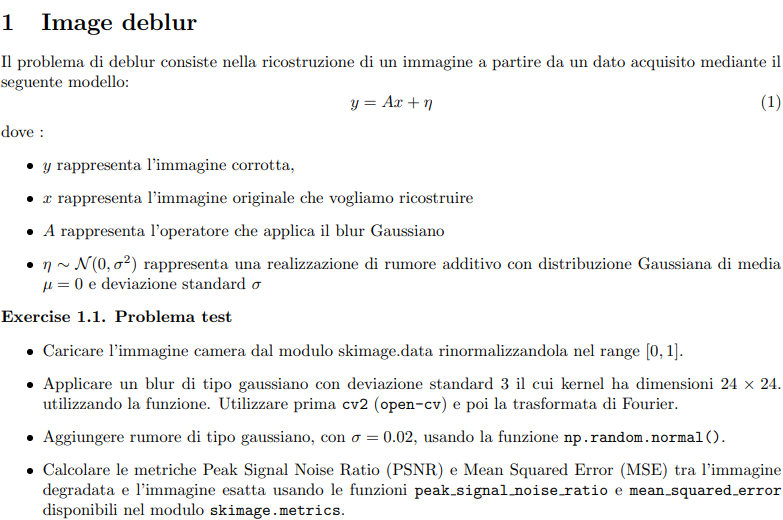

##Utilities


In [1]:
import numpy as np
from numpy import fft
import matplotlib.pyplot as plt

# Crea un kernel Gaussiano di dimensione kernlen e deviazione standard sigma
def gaussian_kernel(kernlen, sigma):
    x = np.linspace(- (kernlen // 2), kernlen // 2, kernlen)
    # Kernel gaussiano unidmensionale
    kern1d = np.exp(- 0.5 * (x**2 / sigma))
    # Kernel gaussiano bidimensionale
    kern2d = np.outer(kern1d, kern1d)
    # Normalizzazione
    return kern2d / kern2d.sum()

# Esegui l'fft del kernel K di dimensione d aggiungendo gli zeri necessari
# ad arrivare a dimensione shape
def psf_fft(K, d, shape):
    # Aggiungi zeri
    K_p = np.zeros(shape)
    K_p[:d, :d] = K

    # Sposta elementi
    p = d // 2
    K_pr = np.roll(np.roll(K_p, -p, 0), -p, 1) # fa lo shift degli elementi del vettore di p posizioni
    # prima lungo l' asse 0 poi lungo l'asse 1
    # Esegui FFT
    K_otf = fft.fft2(K_pr)
    return K_otf #

# Moltiplicazione per A
def A(x, K):
  x = fft.fft2(x)
  return np.real(fft.ifft2(K * x))

# Moltiplicazione per A trasposta
def AT(x, K):
  x = fft.fft2(x)
  return np.real(fft.ifft2(np.conj(K) * x))

def next_step(x,grad,f): # backtracking procedure for the choice of the steplength
  alpha=1.1
  rho = 0.5
  c1 = 0.25
  p=-grad
  j=0
  jmax=10
  while ((f(x+alpha*p) > f(x)+c1*alpha*np.dot(grad,p)) and j<jmax ):
    alpha= rho*alpha
    j+=1
  if (j>jmax):
    return -1
  else:
    print('alpha=',alpha)
    return alpha


def minimize_grad(f,grad_f,x0,step,maxit,tol,xTrue,fixed=True): # funzione che implementa il metodo del gradiente
  #declare x_k and gradient_k vectors
  norm_grad_list=np.zeros(maxit+1)
  function_eval_list=np.zeros(maxit+1)
  error_list=np.zeros(maxit+1)

  #initialize first values
  x_last = x0
  k=0

  function_eval_list[k]=f(x_last)
  error_list[k]=np.linalg.norm(x_last-xTrue)
  norm_grad_list[k]=np.linalg.norm(grad_f(x_last))

  while (np.linalg.norm(grad_f(x_last))>tol and k < maxit ):
    k=k+1
    grad = grad_f(x_last)#direction is given by gradient of the last iteration


    if fixed:
        # Fixed step
        step = step
    else:
        # backtracking step
        step = next_step(x_last,grad,f)

    if(step==-1):
      print('non convergente')
      return (k) #no convergence

    x_last=x_last-step*grad


    function_eval_list[k]=f(x_last)
    error_list[k]=np.linalg.norm(x_last-xTrue)
    norm_grad_list[k]=np.linalg.norm(grad_f(x_last))

  function_eval_list = function_eval_list[:k+1]
  error_list = error_list[:k+1]
  norm_grad_list = norm_grad_list[:k+1]


  return (x_last,norm_grad_list, function_eval_list, error_list,  k)

## Es 1


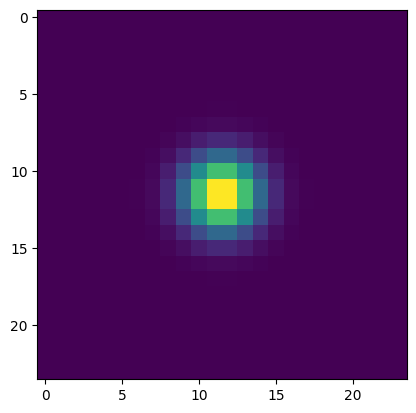

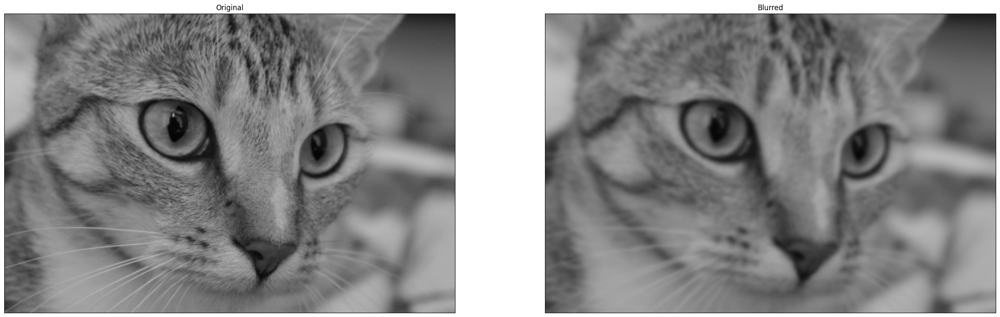

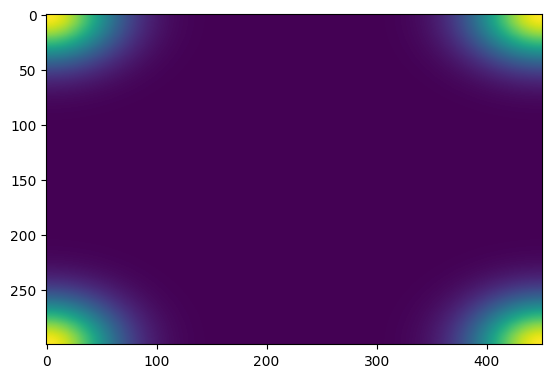

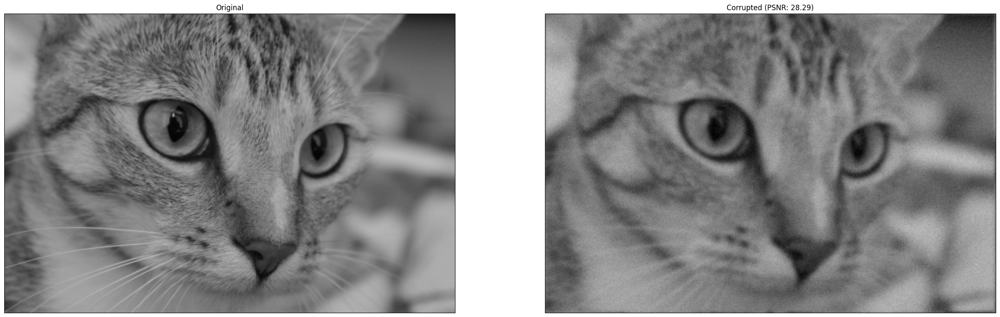

In [2]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, metrics
from skimage.color import rgb2gray
from scipy import signal
from numpy import fft

# Immagine in floating point con valori tra 0 e 1
X = rgb2gray(data.cat()).astype(np.float64)
m, n = X.shape

# Genera il filtro di blur
k = gaussian_kernel(24, 3)
plt.imshow(k)
plt.show()

# Blur with openCV
X_blurred = cv.filter2D(X, -1, k)
plt.figure(figsize=(30, 10))
plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122).imshow(X_blurred, cmap='gray', vmin=0, vmax=1)
plt.title('Blurred')
plt.xticks([]), plt.yticks([])
plt.show()

# Blur with FFT
K = psf_fft(k, 24, X.shape)
plt.imshow(np.abs(K))
plt.show()

X_blurred = fft.ifft2(fft.fft2(X) * K).real

# Genera il rumore
sigma = 0.02
np.random.seed(42)
noise = np.random.normal(size=X.shape, scale = sigma)

# Aggiungi blur e rumore
y = X_blurred + noise
PSNR = metrics.peak_signal_noise_ratio(X, y)
ATy = AT(y, K)


# Visualizziamo i risultati
plt.figure(figsize=(30, 10))
plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title(f'Corrupted (PSNR: {PSNR:.2f})')
plt.xticks([]), plt.yticks([])
plt.show()

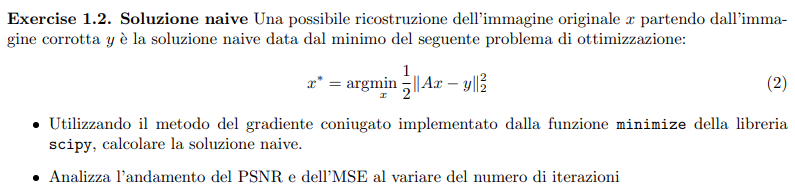


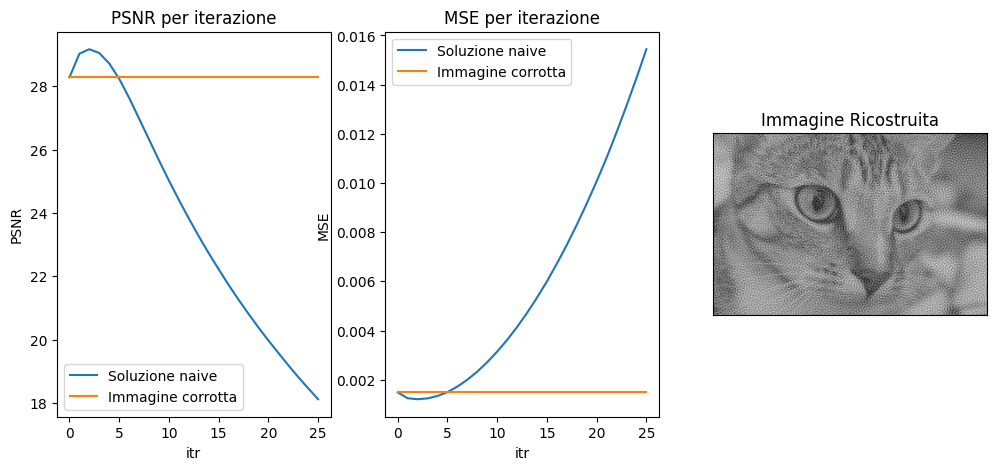

In [3]:
# Soluzione naive
from scipy.optimize import minimize

# Funzione da minimizzare
def f(x):
    x = x.reshape((m, n))
    Ax = A(x, K)
    return 0.5 * np.sum(np.square(Ax - y))

# Gradiente della funzione da minimizzare
def df(x):
    x = x.reshape((m, n))
    ATAx = AT(A(x,K),K)
    d = ATAx - ATy
    return d.reshape(m * n)

# Minimizzazione della funzione
x0 = y.reshape(m*n)
max_iter = 25
res = minimize(f, x0, method='CG', jac=df, options={'maxiter':max_iter, 'return_all':True})

# Per ogni iterazione calcola il PSNR rispetto all'originale
PSNR = np.zeros(max_iter + 1)
MSE = np.zeros(max_iter + 1)
for k, x_k in enumerate(res.allvecs):
    PSNR[k] = metrics.peak_signal_noise_ratio(X, x_k.reshape(X.shape))
    MSE[k] = metrics.mean_squared_error(X, x_k.reshape(X.shape))

# Risultato della minimizzazione
X_res = res.x.reshape((m, n))

# PSNR dell'immagine corrotta rispetto all'oginale
starting_PSNR = np.full(PSNR.shape[0], metrics.peak_signal_noise_ratio(X, y))
starting_MSE = np.full(MSE.shape[0], metrics.mean_squared_error(X, y))

# Visualizziamo i risultati
plt.subplots(1,3, figsize=((12,5)))
ax2 = plt.subplot(1, 3, 1)
ax2.plot(PSNR, label="Soluzione naive")
ax2.plot(starting_PSNR, label="Immagine corrotta")
plt.legend()
plt.title('PSNR per iterazione')
plt.ylabel("PSNR")
plt.xlabel('itr')
ax3 = plt.subplot(1, 3, 2)
ax3.plot(MSE, label="Soluzione naive")
ax3.plot(starting_MSE, label="Immagine corrotta")
plt.legend()
plt.title('MSE per iterazione')
plt.ylabel("MSE")
plt.xlabel('itr')
plt.subplot(1, 3, 3).imshow(X_res, cmap='gray')
plt.title('Immagine Ricostruita')
plt.xticks([]), plt.yticks([])
plt.show()

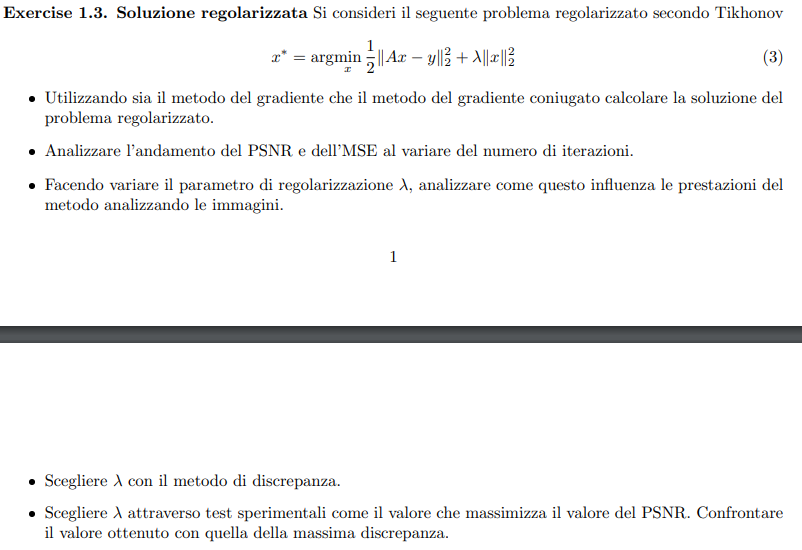

PSNR: 27.73 (λ = 0.01)
PSNR: 29.29 (λ = 0.03)
PSNR: 29.01 (λ = 0.04)
PSNR: 27.95 (λ = 0.06)


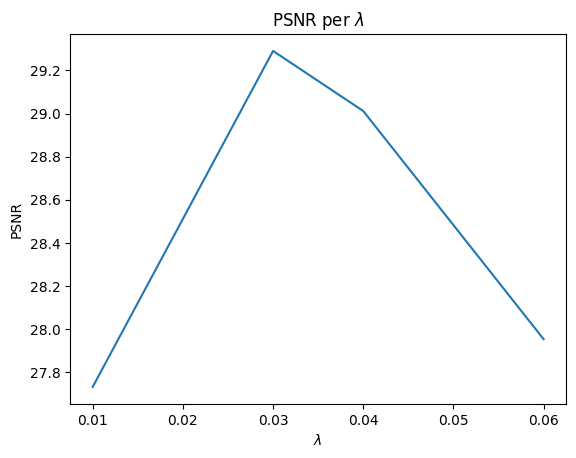

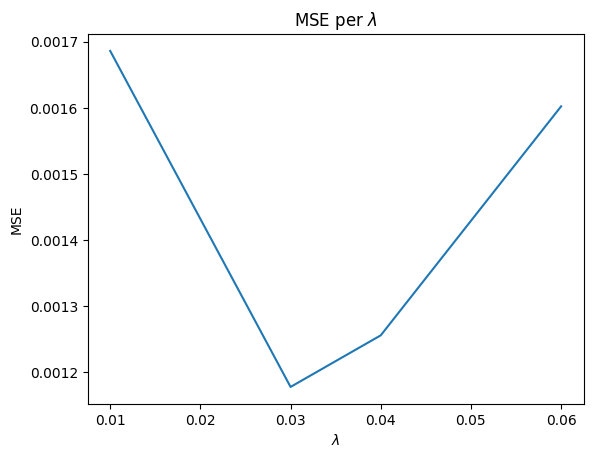

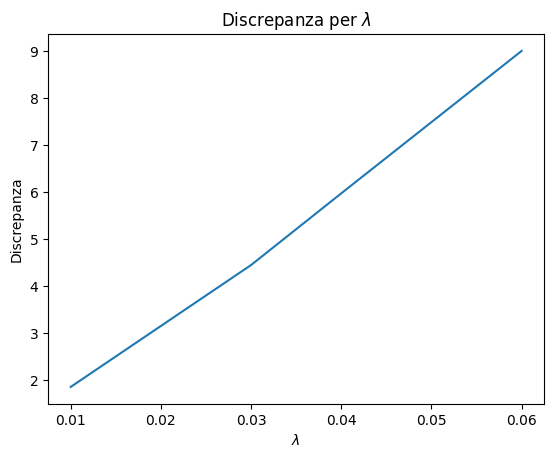

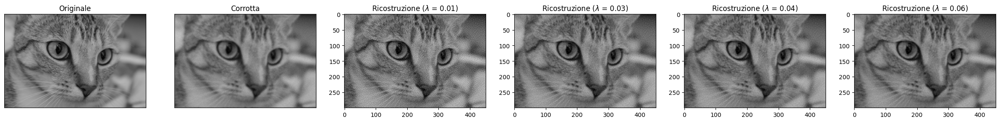

In [4]:
# Regolarizzazione
# Funzione da minimizzare
def f(x, L):
    nsq = np.sum(np.square(x))
    x  = x.reshape((m, n))
    Ax = A(x, K)
    return 0.5 * np.sum(np.square(Ax - y)) + 0.5 * L * nsq

# Gradiente della funzione da minimizzare
def df(x, L):
    Lx = L * x
    x = x.reshape(m, n)
    ATAx = AT(A(x,K),K)
    d = ATAx - ATy
    return d.reshape(m * n) + Lx

x0 = y.reshape(m*n)
lambdas = [0.01,0.03,0.04, 0.06]
PSNRs = []
MSEs = []
Discrepanza = []
images = []

# Ricostruzione per diversi valori del parametro di regolarizzazione
for i, L in enumerate(lambdas):
    # Esegui la minimizzazione con al massimo 50 iterazioni
    max_iter = 50
    res = minimize(f, x0, (L), method='CG', jac=df, options={'maxiter':max_iter})

    # Aggiungi la ricostruzione nella lista images
    X_curr = res.x.reshape(X.shape)
    images.append(X_curr)

    # Stampa il PSNR per il valore di lambda attuale
    PSNR = metrics.peak_signal_noise_ratio(X, X_curr)
    PSNRs.append(PSNR)
    MSEs.append(metrics.mean_squared_error(X, X_curr))
    Discrepanza.append(abs(np.linalg.norm(X-X_curr,2)-np.linalg.norm(1.01*noise,2)))
    print(f'PSNR: {PSNR:.2f} (\u03BB = {L:.2f})')



# Visualizziamo i risultati
plt.plot(lambdas,PSNRs)
plt.title('PSNR per $\lambda$')
plt.ylabel("PSNR")
plt.xlabel('$\lambda$')
plt.show()

plt.plot(lambdas,MSEs)
plt.title('MSE per $\lambda$')
plt.ylabel("MSE")
plt.xlabel('$\lambda$')
plt.show()

plt.plot(lambdas,Discrepanza)
plt.title('Discrepanza per $\lambda$')
plt.ylabel("Discrepanza")
plt.xlabel('$\lambda$')
plt.show()

plt.figure(figsize=(30, 10))

plt.subplot(1, len(lambdas) + 2, 1).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title("Originale")
plt.xticks([]), plt.yticks([])
plt.subplot(1, len(lambdas) + 2, 2).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title("Corrotta")
plt.xticks([]), plt.yticks([])


for i, L in enumerate(lambdas):
  plt.subplot(1, len(lambdas) + 2, i + 3).imshow(images[i], cmap='gray', vmin=0, vmax=1)
  plt.title(f"Ricostruzione ($\lambda$ = {L:.2f})")
plt.show()

PSNR: 29.3040 (λBB = 0.02750)
MSE: 0.00117381 (λBB = 0.0275)
PSNR: 29.3041 (λBB = 0.02767)
MSE: 0.00117380 (λBB = 0.0277)
PSNR: 29.3040 (λBB = 0.02783)
MSE: 0.00117382 (λBB = 0.0278)
PSNR: 29.3038 (λBB = 0.02800)
MSE: 0.00117388 (λBB = 0.0280)


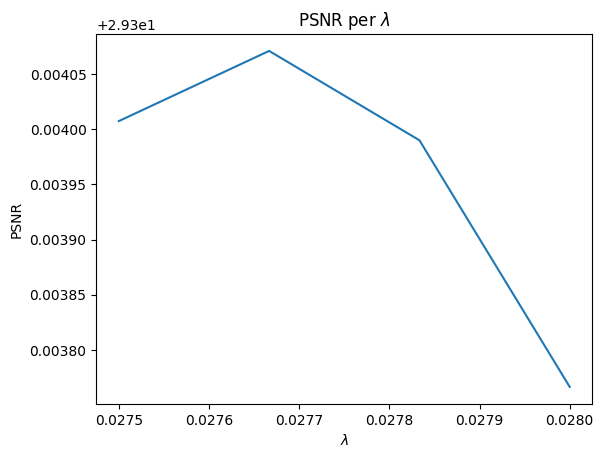

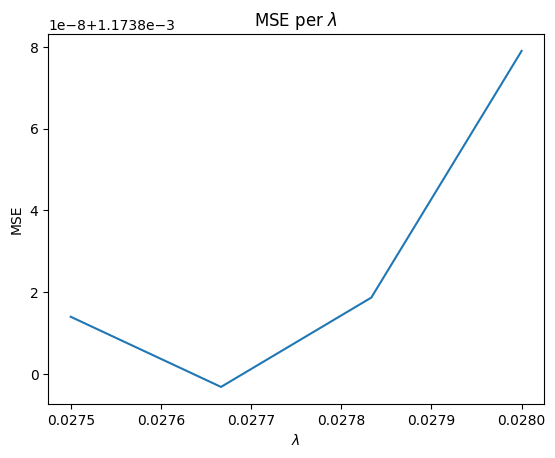

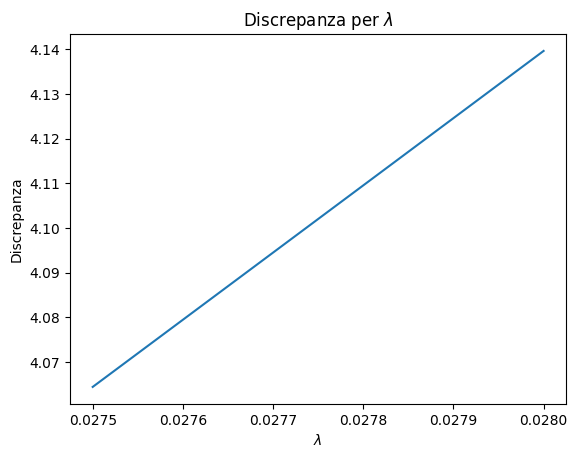

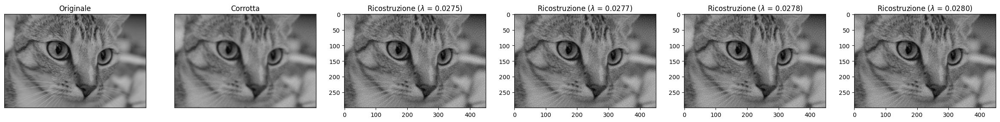

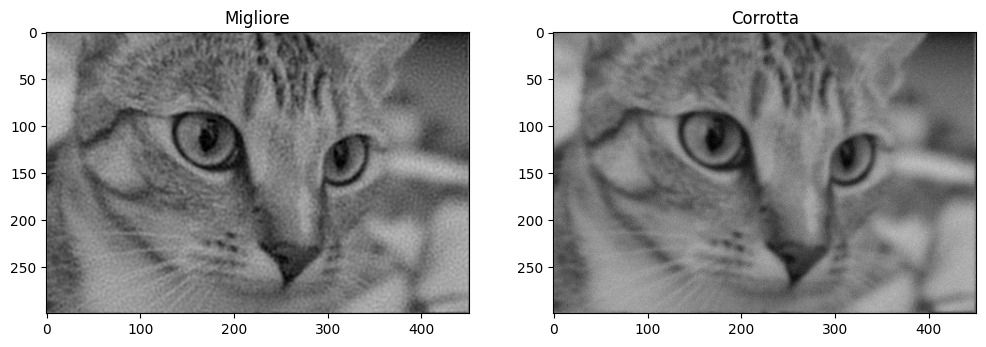

In [5]:
# Regolarizzazione
# Funzione da minimizzare
def f(x, L):
    nsq = np.sum(np.square(x))
    x  = x.reshape((m, n))
    Ax = A(x, K)
    return 0.5 * np.sum(np.square(Ax - y)) + 0.5 * L * nsq

# Gradiente della funzione da minimizzare
def df(x, L):
    Lx = L * x
    x = x.reshape(m, n)
    ATAx = AT(A(x,K),K)
    d = ATAx - ATy
    return d.reshape(m * n) + Lx

x0 = y.reshape(m*n)
lambdas = np.linspace(0.0275, 0.028, 4)
PSNRs = []
MSEs = []
Discrepanza = []
images = []

# Ricostruzione per diversi valori del parametro di regolarizzazione
for i, L in enumerate(lambdas):
    # Esegui la minimizzazione con al massimo 50 iterazioni
    max_iter = 50
    res = minimize(f, x0, (L), method='CG', jac=df, options={'maxiter':max_iter})

    # Aggiungi la ricostruzione nella lista images
    X_curr = res.x.reshape(X.shape)
    images.append(X_curr)

    # Stampa il PSNR per il valore di lambda attuale
    PSNR = metrics.peak_signal_noise_ratio(X, X_curr)
    PSNRs.append(PSNR)
    MSEs.append(metrics.mean_squared_error(X, X_curr))
    Discrepanza.append(abs(np.linalg.norm(X-X_curr,2)-np.linalg.norm(1.01*noise,2)))
    print(f'PSNR: {PSNR:.4f} (\u03BBBB = {L:.5f})')
    print(f'MSE: {metrics.mean_squared_error(X, X_curr):.8f} (\u03BBBB = {L:.4f})')



# Visualizziamo i risultati
plt.plot(lambdas,PSNRs)
plt.title('PSNR per $\lambda$')
plt.ylabel("PSNR")
plt.xlabel('$\lambda$')
plt.show()

plt.plot(lambdas,MSEs)
plt.title('MSE per $\lambda$')
plt.ylabel("MSE")
plt.xlabel('$\lambda$')
plt.show()

plt.plot(lambdas,Discrepanza)
plt.title('Discrepanza per $\lambda$')
plt.ylabel("Discrepanza")
plt.xlabel('$\lambda$')
plt.show()

plt.figure(figsize=(30, 10))

plt.subplot(1, len(lambdas) + 2, 1).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title("Originale")
plt.xticks([]), plt.yticks([])
plt.subplot(1, len(lambdas) + 2, 2).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title("Corrotta")
plt.xticks([]), plt.yticks([])

for i, L in enumerate(lambdas):
  plt.subplot(1, len(lambdas) + 2, i + 3).imshow(images[i], cmap='gray', vmin=0, vmax=1)
  plt.title(f"Ricostruzione ($\lambda$ = {L:.4f})")
plt.show()

plt.figure(figsize=(12, 8))
plt.subplot(1,2,1).imshow(images[np.argmax(PSNRs)], cmap='gray', vmin=0, vmax=1)
plt.title("Migliore")
plt.subplot(1, 2, 2).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title("Corrotta")
plt.show()

PSNR: 27.0954 (λBB = 0.00800)
MSE: 0.00195190 (λBB = 0.0080)
PSNR: 27.5423 (λBB = 0.00933)
MSE: 0.00176105 (λBB = 0.0093)
PSNR: 27.9011 (λBB = 0.01067)
MSE: 0.00162139 (λBB = 0.0107)
PSNR: 28.1927 (λBB = 0.01200)
MSE: 0.00151612 (λBB = 0.0120)


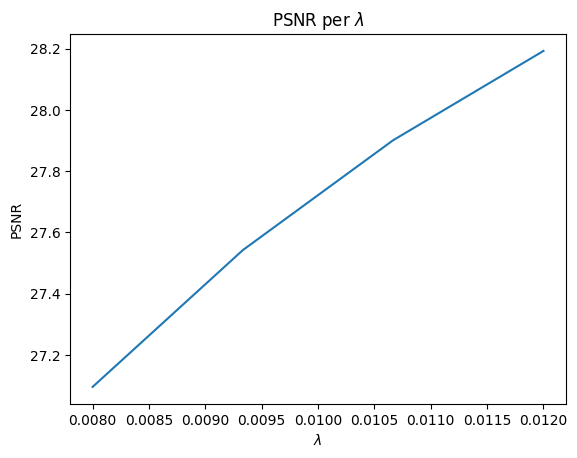

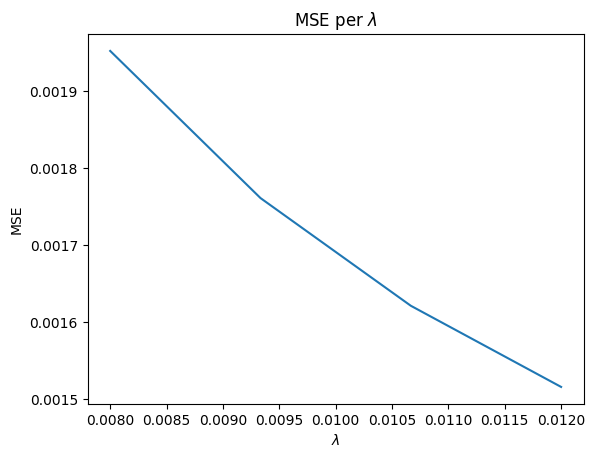

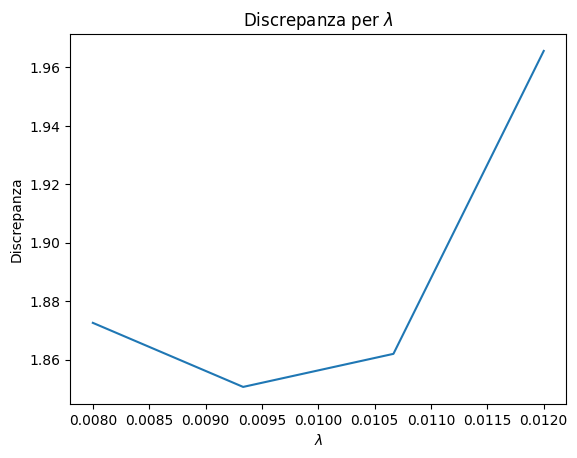

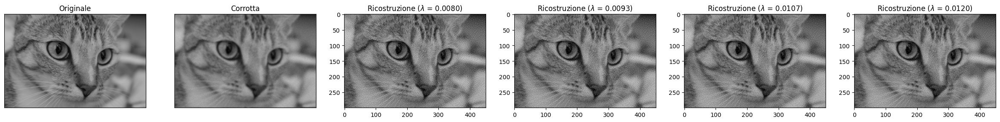

In [6]:
# Regolarizzazione
# Funzione da minimizzare
def f(x, L):
    nsq = np.sum(np.square(x))
    x  = x.reshape((m, n))
    Ax = A(x, K)
    return 0.5 * np.sum(np.square(Ax - y)) + 0.5 * L * nsq

# Gradiente della funzione da minimizzare
def df(x, L):
    Lx = L * x
    x = x.reshape(m, n)
    ATAx = AT(A(x,K),K)
    d = ATAx - ATy
    return d.reshape(m * n) + Lx

x0 = y.reshape(m*n)
lambdas = np.linspace(0.008, 0.012, 4)
PSNRs = []
MSEs = []
Discrepanza = []
images = []

# Ricostruzione per diversi valori del parametro di regolarizzazione
for i, L in enumerate(lambdas):
    # Esegui la minimizzazione con al massimo 50 iterazioni
    max_iter = 50
    res = minimize(f, x0, (L), method='CG', jac=df, options={'maxiter':max_iter})

    # Aggiungi la ricostruzione nella lista images
    X_curr = res.x.reshape(X.shape)
    images.append(X_curr)

    # Stampa il PSNR per il valore di lambda attuale
    PSNR = metrics.peak_signal_noise_ratio(X, X_curr)
    PSNRs.append(PSNR)
    MSEs.append(metrics.mean_squared_error(X, X_curr))
    Discrepanza.append(np.linalg.norm(X-X_curr,2)-np.linalg.norm(1.01*noise,2))
    print(f'PSNR: {PSNR:.4f} (\u03BBBB = {L:.5f})')
    print(f'MSE: {metrics.mean_squared_error(X, X_curr):.8f} (\u03BBBB = {L:.4f})')



# Visualizziamo i risultati
plt.plot(lambdas,PSNRs)
plt.title('PSNR per $\lambda$')
plt.ylabel("PSNR")
plt.xlabel('$\lambda$')
plt.show()

plt.plot(lambdas,MSEs)
plt.title('MSE per $\lambda$')
plt.ylabel("MSE")
plt.xlabel('$\lambda$')
plt.show()

plt.plot(lambdas,Discrepanza)
plt.title('Discrepanza per $\lambda$')
plt.ylabel("Discrepanza")
plt.xlabel('$\lambda$')
plt.show()

plt.figure(figsize=(30, 10))

plt.subplot(1, len(lambdas) + 2, 1).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title("Originale")
plt.xticks([]), plt.yticks([])
plt.subplot(1, len(lambdas) + 2, 2).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title("Corrotta")
plt.xticks([]), plt.yticks([])

for i, L in enumerate(lambdas):
  plt.subplot(1, len(lambdas) + 2, i + 3).imshow(images[i], cmap='gray', vmin=0, vmax=1)
  plt.title(f"Ricostruzione ($\lambda$ = {L:.4f})")
plt.show()

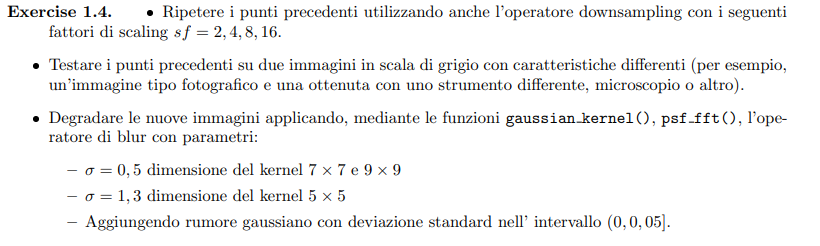

##Utilities

In [7]:
import numpy as np
from numpy import fft
from skimage.transform import rescale

# Crea un kernel Gaussiano di dimensione kernlen e deviazione standard sigma
def gaussian_kernel(kernlen, sigma):
    x = np.linspace(- (kernlen // 2), kernlen // 2, kernlen)
    # Kernel gaussiano unidmensionale
    kern1d = np.exp(- 0.5 * (x**2 / sigma))
    # Kernel gaussiano bidimensionale
    kern2d = np.outer(kern1d, kern1d)
    # Normalizzazione
    return kern2d / kern2d.sum()

# Esegui l'fft del kernel K di dimensione d aggiungendo gli zeri necessari
# ad arrivare a dimensione shape
def psf_fft(K, d, shape):
    # Aggiungi zeri
    K_p = np.zeros(shape)
    K_p[:d, :d] = K

    # Sposta elementi
    p = d // 2
    K_pr = np.roll(np.roll(K_p, -p, 0), -p, 1) # fa lo shift degli elementi del vettore di p posizioni
    # prima lungo l' asse 0 poi lungo l'asse 1
    # Esegui FFT
    K_otf = fft.fft2(K_pr)
    return K_otf #

# Moltiplicazione per A
def A(x, K, sf):
    x = fft.fft2(x)
    y = np.real(fft.ifft2(K * x))
    return rescale(y, 1/sf)

# Moltiplicazione per A trasposta
def AT(x, K, sf):
    x = rescale(x, sf)
    x = fft.fft2(x)
    y = np.real(fft.ifft2(np.conj(K) * x))
    return y

def next_step(x,grad,f): # backtracking procedure for the choice of the steplength
  alpha=1.1
  rho = 0.5
  c1 = 0.25
  p=-grad
  j=0
  jmax=10
  while ((f(x+alpha*p) > f(x)+c1*alpha*np.dot(grad,p)) and j<jmax ):
    alpha= rho*alpha
    j+=1
  if (j>jmax):
    return -1
  else:
    print('alpha=',alpha)
    return alpha


def minimize(f,grad_f,x0,step,maxit,tol,xTrue,fixed=True): # funzione che implementa il metodo del gradiente
  #declare x_k and gradient_k vectors
  norm_grad_list=np.zeros(maxit+1)
  function_eval_list=np.zeros(maxit+1)
  error_list=np.zeros(maxit+1)

  #initialize first values
  x_last = x0
  k=0

  function_eval_list[k]=f(x_last)
  error_list[k]=np.linalg.norm(x_last-xTrue)
  norm_grad_list[k]=np.linalg.norm(grad_f(x_last))

  while (np.linalg.norm(grad_f(x_last))>tol and k < maxit ):
    k=k+1
    grad = grad_f(x_last)#direction is given by gradient of the last iteration


    if fixed:
        # Fixed step
        step = step
    else:
        # backtracking step
        step = next_step(x_last,grad,f)

    if(step==-1):
      print('non convergente')
      return (k) #no convergence

    x_last=x_last-step*grad


    function_eval_list[k]=f(x_last)
    error_list[k]=np.linalg.norm(x_last-xTrue)
    norm_grad_list[k]=np.linalg.norm(grad_f(x_last))

  function_eval_list = function_eval_list[:k+1]
  error_list = error_list[:k+1]
  norm_grad_list = norm_grad_list[:k+1]


  return (x_last,norm_grad_list, function_eval_list, error_list,  k)

# Variazione totale
def totvar(x, eps = 1e-2):
  # Calcola il gradiente di x
  dx, dy = np.gradient(x)
  n2 = np.square(dx) + np.square(dy)

  # Calcola la variazione totale di x
  tv = np.sqrt(n2 + eps**2).sum()
  return tv

# Gradiente della variazione totale
def grad_totvar(x, eps = 1e-2):
  # Calcola il numeratore della frazione
  dx, dy = np.gradient(x)

  # Calcola il denominatore della frazione
  n2 = np.square(dx) + np.square(dy)
  den = np.sqrt(n2 + eps**2)

  # Calcola le due componenti di F dividendo il gradiente per il denominatore
  Fx = dx / den
  Fy = dy / den

  # Calcola la derivata orizzontale di Fx
  dFdx = np.gradient(Fx, axis=0)

  # Calcola la derivata verticale di Fy
  dFdy = np.gradient(Fy, axis=1)

  # Calcola la divergenza
  div = (dFdx + dFdy)

  # Restituisci il valore del gradiente della variazione totale
  return -div

##Esercizio

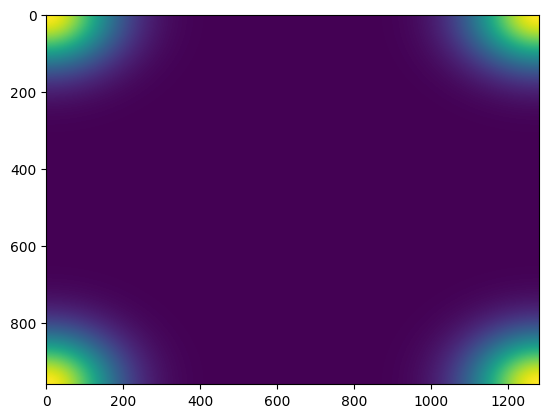

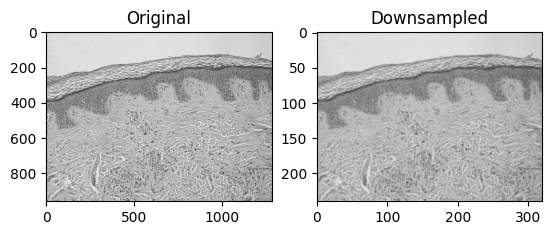

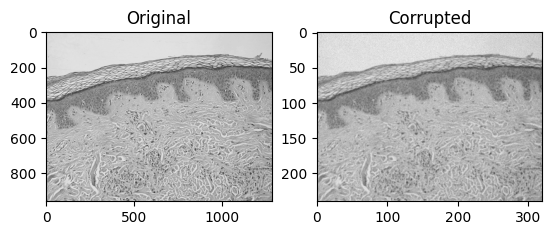

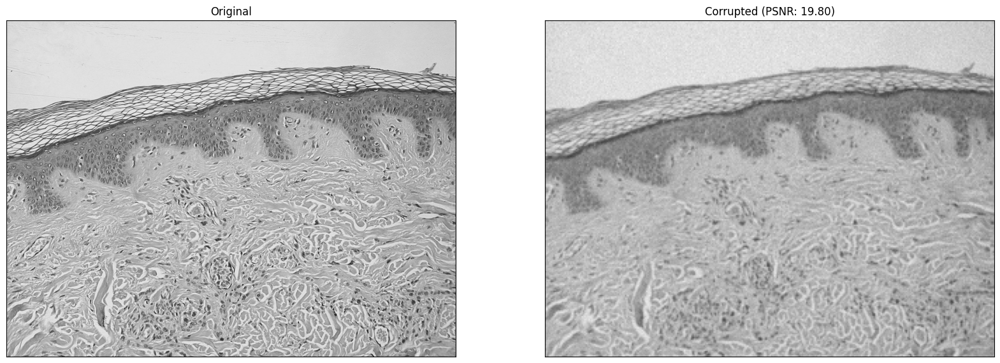

In [8]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, metrics
from scipy import signal
from numpy import fft

# Immagine in floating point con valori tra 0 e 1
X = rgb2gray(data.skin()).astype(np.float64)
m, n = X.shape

sf = 4
# Genera il filtro di blur
k = gaussian_kernel(24, 3)
"""
plt.imshow(k)
plt.show()

X_blurred = A(X, K, sf)
"""
#Blur with FFT
K = psf_fft(k, 24, X.shape)
plt.imshow(np.abs(K))
plt.show()

X_blurred = A(X, K, sf)

# Blur with openCV
#X_blurred = cv.filter2D(X, -1, k)
plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title('Original')
#plt.xticks([]), plt.yticks([])
plt.subplot(122).imshow(X_blurred, cmap='gray', vmin=0, vmax=1)
plt.title('Downsampled')
#plt.xticks([]), plt.yticks([])
plt.show()


# Genera il rumore
sigma = 0.02
np.random.seed(42)
noise = np.random.normal(size=X_blurred.shape, scale = sigma)

# Aggiungi blur e rumore
y = X_blurred + noise
ATy = AT(y, K, sf) #AT = AT ST

plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title('Original')
#plt.xticks([]), plt.yticks([])
plt.subplot(122).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title('Corrupted')
#plt.xticks([]), plt.yticks([])
plt.show()

PSNR = metrics.peak_signal_noise_ratio(X, ATy)
mse = metrics.mean_squared_error(X, ATy)



# Visualizziamo i risultati
plt.figure(figsize=(20, 10))
plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title(f'Corrupted (PSNR: {PSNR:.2f})')
plt.xticks([]), plt.yticks([])
plt.show()

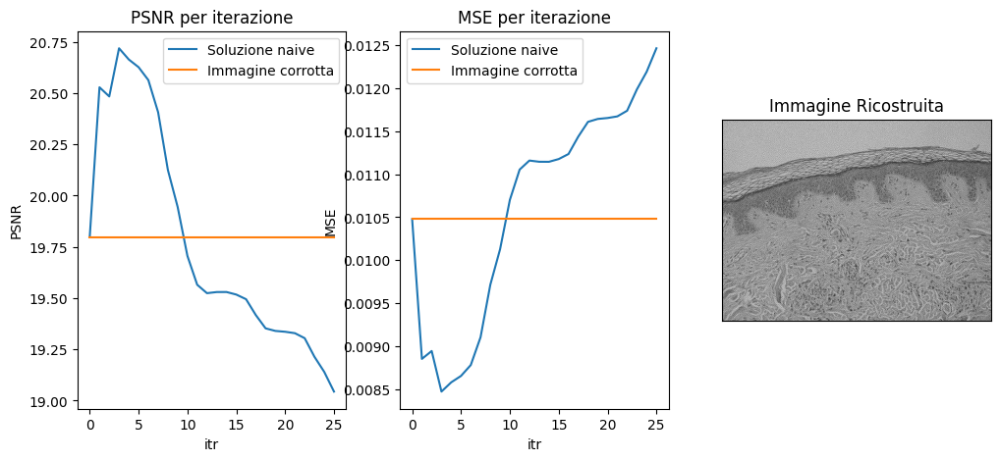

In [9]:
# Soluzione naive
from scipy.optimize import minimize

# Funzione da minimizzare
def f(x):
    x = x.reshape((m, n))
    Ax = A(x, K, sf)
    return 0.5 * np.sum(np.square(Ax - y))

# Gradiente della funzione da minimizzare
def df(x):
    x = x.reshape((m, n))
    ATAx = AT(A(x,K,sf),K, sf)
    d = ATAx - ATy
    return d.reshape(m * n)

# Minimizzazione della funzione
x0 = ATy.reshape(m*n)
max_iter = 25
res = minimize(f, x0, method='CG', jac=df, options={'maxiter':max_iter, 'return_all':True})

PSNR = np.zeros(max_iter + 1)
MSE = np.zeros(max_iter + 1)
for k, x_k in enumerate(res.allvecs):
    PSNR[k] = metrics.peak_signal_noise_ratio(X, x_k.reshape(X.shape))
    MSE[k] = metrics.mean_squared_error(X, x_k.reshape(X.shape))

# Risultato della minimizzazione
X_res = res.x.reshape((m, n))

# PSNR dell'immagine corrotta rispetto all'oginale
starting_PSNR = np.full(PSNR.shape[0], metrics.peak_signal_noise_ratio(X, ATy))
starting_MSE = np.full(MSE.shape[0], metrics.mean_squared_error(X, ATy))

# Visualizziamo i risultati
plt.subplots(1,3, figsize=((12,5)))
ax2 = plt.subplot(1, 3, 1)
ax2.plot(PSNR, label="Soluzione naive")
ax2.plot(starting_PSNR, label="Immagine corrotta")
plt.legend()
plt.title('PSNR per iterazione')
plt.ylabel("PSNR")
plt.xlabel('itr')
ax3 = plt.subplot(1, 3, 2)
ax3.plot(MSE, label="Soluzione naive")
ax3.plot(starting_MSE, label="Immagine corrotta")
plt.legend()
plt.title('MSE per iterazione')
plt.ylabel("MSE")
plt.xlabel('itr')
plt.subplot(1, 3, 3).imshow(X_res, cmap='gray')
plt.title('Immagine Ricostruita')
plt.xticks([]), plt.yticks([])
plt.show()

PSNR: 20.5247 (λBB = 0.00200)
MSE: 0.00886202 (λBB = 0.0020)
PSNR: 20.5220 (λBB = 0.00500)
MSE: 0.00886738 (λBB = 0.0050)
PSNR: 20.4312 (λBB = 0.01000)
MSE: 0.00905478 (λBB = 0.0100)
PSNR: 20.5879 (λBB = 0.02000)
MSE: 0.00873403 (λBB = 0.0200)
PSNR: 20.2988 (λBB = 0.03000)
MSE: 0.00933511 (λBB = 0.0300)


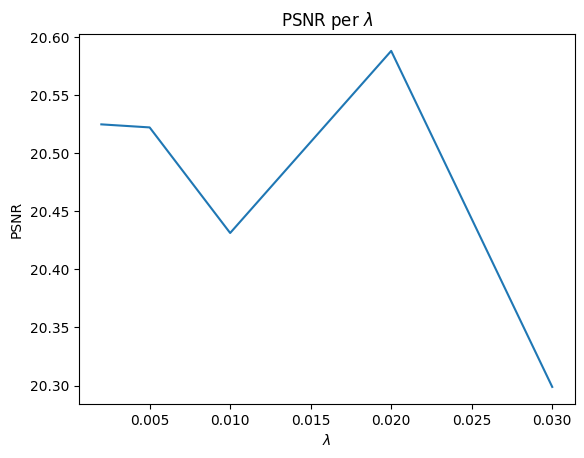

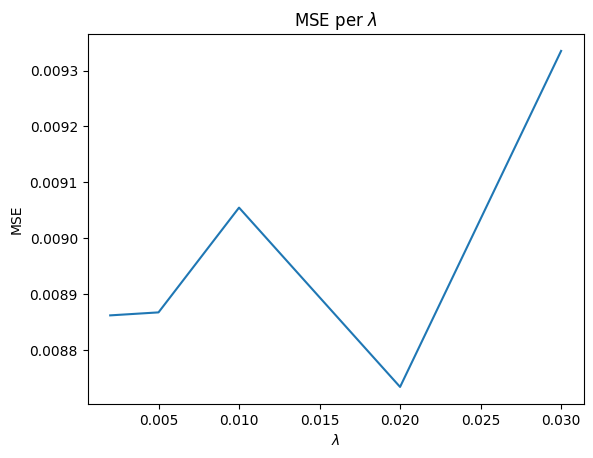

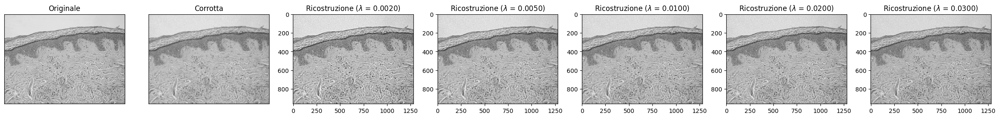

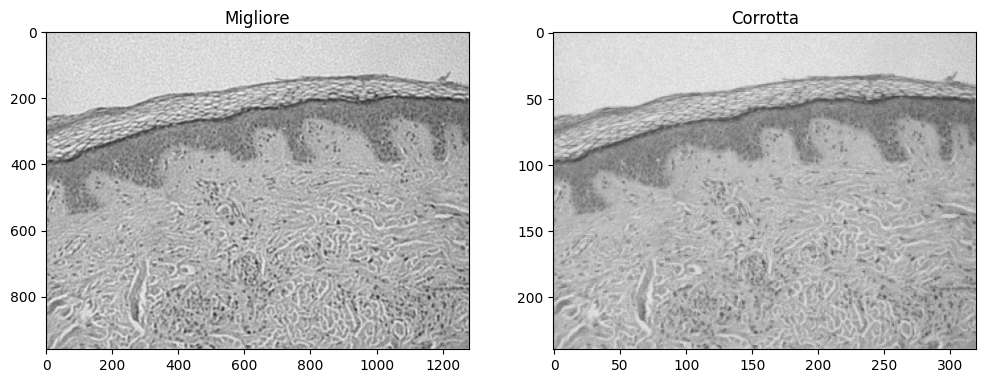

In [10]:
# Regolarizzazione
# Funzione da minimizzare
def f(x, L):
    nsq = np.sum(np.square(x))
    x  = x.reshape((m, n))
    Ax = A(x, K, sf)
    return 0.5 * np.sum(np.square(Ax - y)) + 0.5 * L * nsq

# Gradiente della funzione da minimizzare
def df(x, L):
    Lx = L * x
    x = x.reshape(m, n)
    ATAx = AT(A(x,K,sf),K,sf)
    d = ATAx - ATy
    return d.reshape(m * n) + Lx

x0 = ATy.reshape(m*n)
lambdas = [0.002,0.005,0.01,0.02,0.03]
PSNRs = []
MSEs = []
images = []

# Ricostruzione per diversi valori del parametro di regolarizzazione
for i, L in enumerate(lambdas):
    # Esegui la minimizzazione con al massimo 50 iterazioni
    max_iter = 50
    res = minimize(f, x0, (L), method='CG', jac=df, options={'maxiter':max_iter})

    # Aggiungi la ricostruzione nella lista images
    X_curr = res.x.reshape(X.shape)
    images.append(X_curr)

    # Stampa il PSNR per il valore di lambda attuale
    PSNR = metrics.peak_signal_noise_ratio(X, X_curr)
    PSNRs.append(PSNR)
    MSEs.append(metrics.mean_squared_error(X, X_curr))
    print(f'PSNR: {PSNR:.4f} (\u03BBBB = {L:.5f})')
    print(f'MSE: {metrics.mean_squared_error(X, X_curr):.8f} (\u03BBBB = {L:.4f})')



# Visualizziamo i risultati
plt.plot(lambdas,PSNRs)
plt.title('PSNR per $\lambda$')
plt.ylabel("PSNR")
plt.xlabel('$\lambda$')
plt.show()

plt.plot(lambdas,MSEs)
plt.title('MSE per $\lambda$')
plt.ylabel("MSE")
plt.xlabel('$\lambda$')
plt.show()

plt.figure(figsize=(30, 10))

plt.subplot(1, len(lambdas) + 2, 1).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title("Originale")
plt.xticks([]), plt.yticks([])
plt.subplot(1, len(lambdas) + 2, 2).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title("Corrotta")
plt.xticks([]), plt.yticks([])


for i, L in enumerate(lambdas):
  plt.subplot(1, len(lambdas) + 2, i + 3).imshow(images[i], cmap='gray', vmin=0, vmax=1)
  plt.title(f"Ricostruzione ($\lambda$ = {L:.4f})")
plt.show()

plt.figure(figsize=(12, 8))
plt.subplot(1,2,1).imshow(images[np.argmax(PSNRs)], cmap='gray', vmin=0, vmax=1)
plt.title("Migliore")
plt.subplot(1, 2, 2).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title("Corrotta")
plt.show()

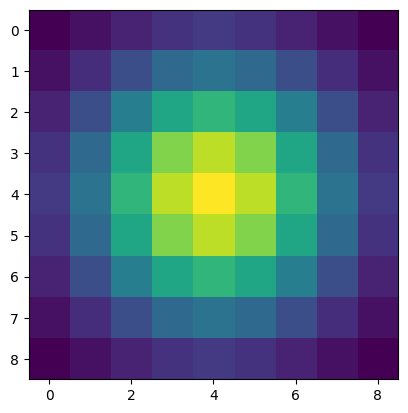

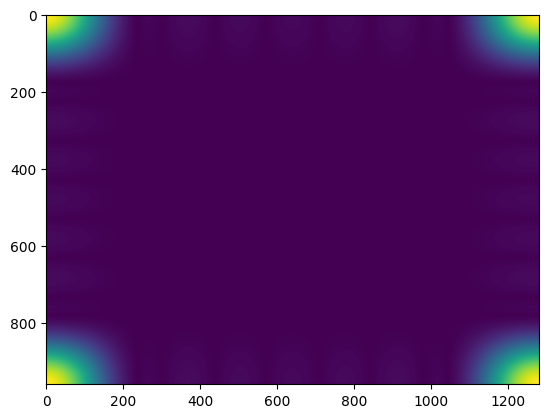

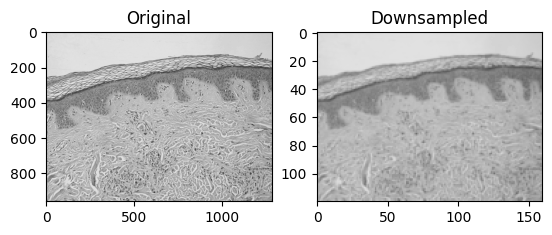

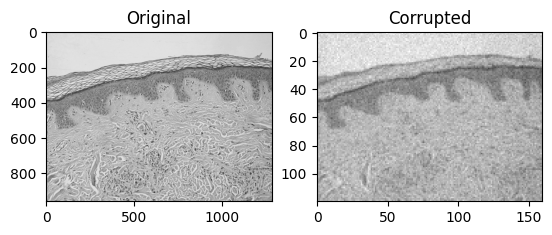

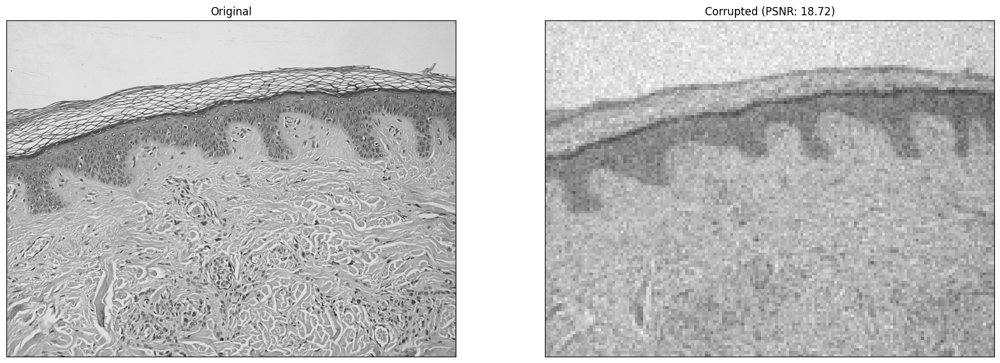

In [22]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, metrics
from scipy import signal
from numpy import fft

# Immagine in floating point con valori tra 0 e 1
X = rgb2gray(data.skin()).astype(np.float64)
m, n = X.shape

sf = 8
# Genera il filtro di blur
k = gaussian_kernel(9, 5)
plt.imshow(k)
plt.show()

#X_blurred = A(X, K, sf)

#Blur with FFT
K = psf_fft(k, 9, X.shape)
plt.imshow(np.abs(K))
plt.show()

X_blurred = A(X, K, sf)

# Blur with openCV
#X_blurred = cv.filter2D(X, -1, k)
plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title('Original')
#plt.xticks([]), plt.yticks([])
plt.subplot(122).imshow(X_blurred, cmap='gray', vmin=0, vmax=1)
plt.title('Downsampled')
#plt.xticks([]), plt.yticks([])
plt.show()


# Genera il rumore
sigma = 0.04
np.random.seed(42)
noise = np.random.normal(size=X_blurred.shape, scale = sigma)

# Aggiungi blur e rumore
y = X_blurred + noise
ATy = AT(y, K, sf) #AT = AT ST


plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title('Original')
#plt.xticks([]), plt.yticks([])
plt.subplot(122).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title('Corrupted')
#plt.xticks([]), plt.yticks([])
plt.show()

PSNR = metrics.peak_signal_noise_ratio(X, ATy)
mse = metrics.mean_squared_error(X, ATy)



# Visualizziamo i risultati
plt.figure(figsize=(20, 10))
plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title(f'Corrupted (PSNR: {PSNR:.2f})')
plt.xticks([]), plt.yticks([])
plt.show()

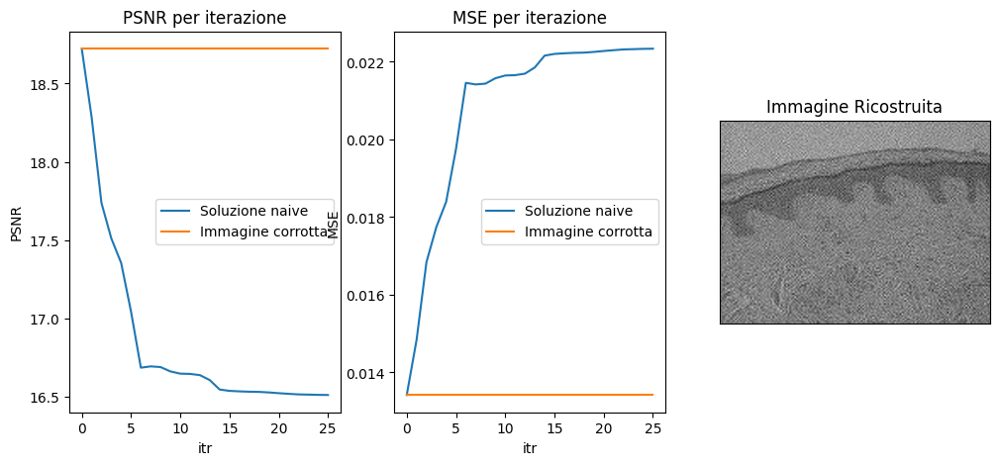

In [12]:
# Soluzione naive
from scipy.optimize import minimize

# Funzione da minimizzare
def f(x):
    x = x.reshape((m, n))
    Ax = A(x, K, sf)
    return 0.5 * np.sum(np.square(Ax - y))

# Gradiente della funzione da minimizzare
def df(x):
    x = x.reshape((m, n))
    ATAx = AT(A(x,K,sf),K, sf)
    d = ATAx - ATy
    return d.reshape(m * n)

# Minimizzazione della funzione
x0 = ATy.reshape(m*n)
max_iter = 25
res = minimize(f, x0, method='CG', jac=df, options={'maxiter':max_iter, 'return_all':True})

PSNR = np.zeros(max_iter + 1)
MSE = np.zeros(max_iter + 1)
for k, x_k in enumerate(res.allvecs):
    PSNR[k] = metrics.peak_signal_noise_ratio(X, x_k.reshape(X.shape))
    MSE[k] = metrics.mean_squared_error(X, x_k.reshape(X.shape))

# Risultato della minimizzazione
X_res = res.x.reshape((m, n))

# PSNR dell'immagine corrotta rispetto all'oginale
starting_PSNR = np.full(PSNR.shape[0], metrics.peak_signal_noise_ratio(X, ATy))
starting_MSE = np.full(MSE.shape[0], metrics.mean_squared_error(X, ATy))

# Visualizziamo i risultati
plt.subplots(1,3, figsize=((12,5)))
ax2 = plt.subplot(1, 3, 1)
ax2.plot(PSNR, label="Soluzione naive")
ax2.plot(starting_PSNR, label="Immagine corrotta")
plt.legend()
plt.title('PSNR per iterazione')
plt.ylabel("PSNR")
plt.xlabel('itr')
ax3 = plt.subplot(1, 3, 2)
ax3.plot(MSE, label="Soluzione naive")
ax3.plot(starting_MSE, label="Immagine corrotta")
plt.legend()
plt.title('MSE per iterazione')
plt.ylabel("MSE")
plt.xlabel('itr')
plt.subplot(1, 3, 3).imshow(X_res, cmap='gray')
plt.title('Immagine Ricostruita')
plt.xticks([]), plt.yticks([])
plt.show()

PSNR: 18.2866 (λBB = 0.00200)
MSE: 0.01483681 (λBB = 0.0020)
PSNR: 18.3639 (λBB = 0.00500)
MSE: 0.01457502 (λBB = 0.0050)
PSNR: 18.4432 (λBB = 0.01000)
MSE: 0.01431123 (λBB = 0.0100)
PSNR: 18.5119 (λBB = 0.02000)
MSE: 0.01408659 (λBB = 0.0200)
PSNR: 18.4838 (λBB = 0.03000)
MSE: 0.01417828 (λBB = 0.0300)


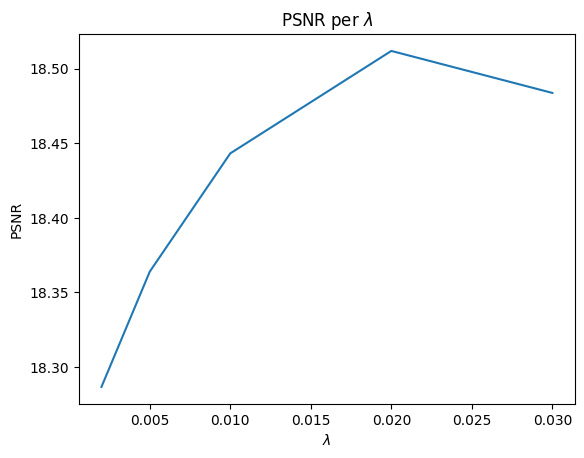

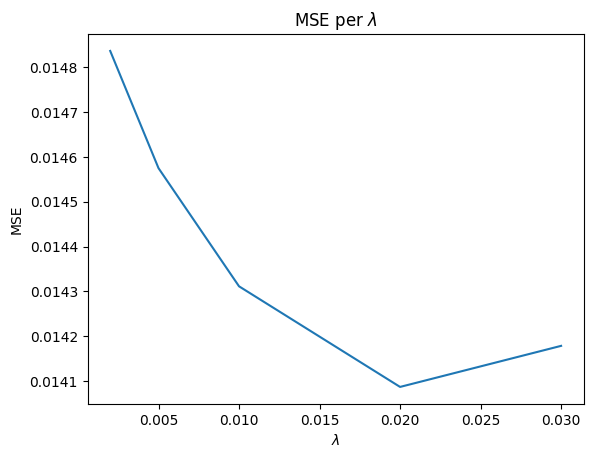

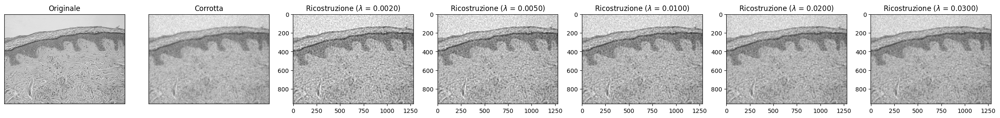

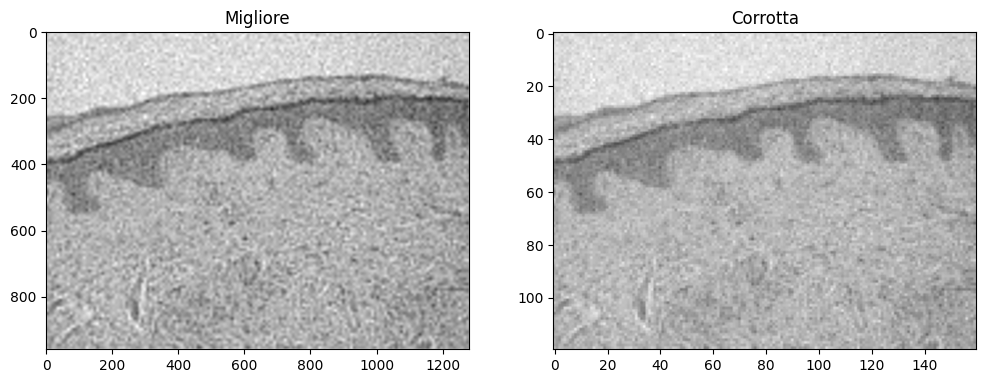

In [23]:
# Regolarizzazione
# Funzione da minimizzare
def f(x, L):
    nsq = np.sum(np.square(x))
    x  = x.reshape((m, n))
    Ax = A(x, K, sf)
    return 0.5 * np.sum(np.square(Ax - y)) + 0.5 * L * nsq

# Gradiente della funzione da minimizzare
def df(x, L):
    Lx = L * x
    x = x.reshape(m, n)
    ATAx = AT(A(x,K,sf),K,sf)
    d = ATAx - ATy
    return d.reshape(m * n) + Lx

x0 = ATy.reshape(m*n)
lambdas = [0.002,0.005,0.01,0.02,0.03]
PSNRs = []
MSEs = []
images = []

# Ricostruzione per diversi valori del parametro di regolarizzazione
for i, L in enumerate(lambdas):
    # Esegui la minimizzazione con al massimo 50 iterazioni
    max_iter = 50
    res = minimize(f, x0, (L), method='CG', jac=df, options={'maxiter':max_iter})

    # Aggiungi la ricostruzione nella lista images
    X_curr = res.x.reshape(X.shape)
    images.append(X_curr)

    # Stampa il PSNR per il valore di lambda attuale
    PSNR = metrics.peak_signal_noise_ratio(X, X_curr)
    PSNRs.append(PSNR)
    MSEs.append(metrics.mean_squared_error(X, X_curr))
    print(f'PSNR: {PSNR:.4f} (\u03BBBB = {L:.5f})')
    print(f'MSE: {metrics.mean_squared_error(X, X_curr):.8f} (\u03BBBB = {L:.4f})')



# Visualizziamo i risultati
plt.plot(lambdas,PSNRs)
plt.title('PSNR per $\lambda$')
plt.ylabel("PSNR")
plt.xlabel('$\lambda$')
plt.show()

plt.plot(lambdas,MSEs)
plt.title('MSE per $\lambda$')
plt.ylabel("MSE")
plt.xlabel('$\lambda$')
plt.show()

plt.figure(figsize=(30, 10))

plt.subplot(1, len(lambdas) + 2, 1).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title("Originale")
plt.xticks([]), plt.yticks([])
plt.subplot(1, len(lambdas) + 2, 2).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title("Corrotta")
plt.xticks([]), plt.yticks([])


for i, L in enumerate(lambdas):
  plt.subplot(1, len(lambdas) + 2, i + 3).imshow(images[i], cmap='gray', vmin=0, vmax=1)
  plt.title(f"Ricostruzione ($\lambda$ = {L:.4f})")
plt.show()

plt.figure(figsize=(12, 8))
plt.subplot(1,2,1).imshow(images[np.argmax(PSNRs)], cmap='gray', vmin=0, vmax=1)
plt.title("Migliore")
plt.subplot(1, 2, 2).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title("Corrotta")
plt.show()

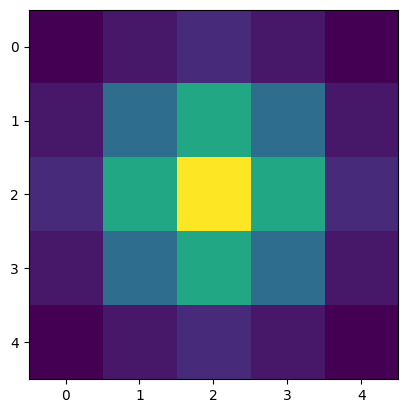

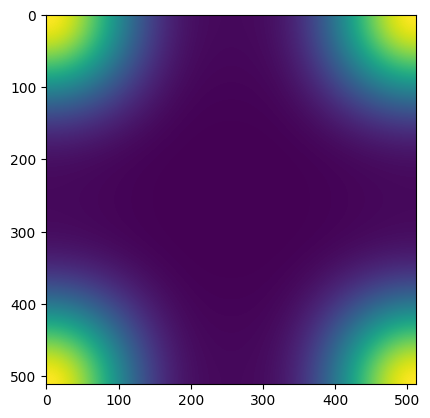

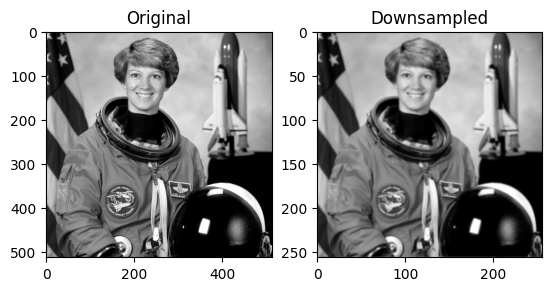

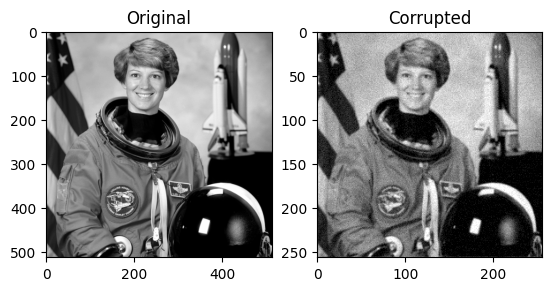

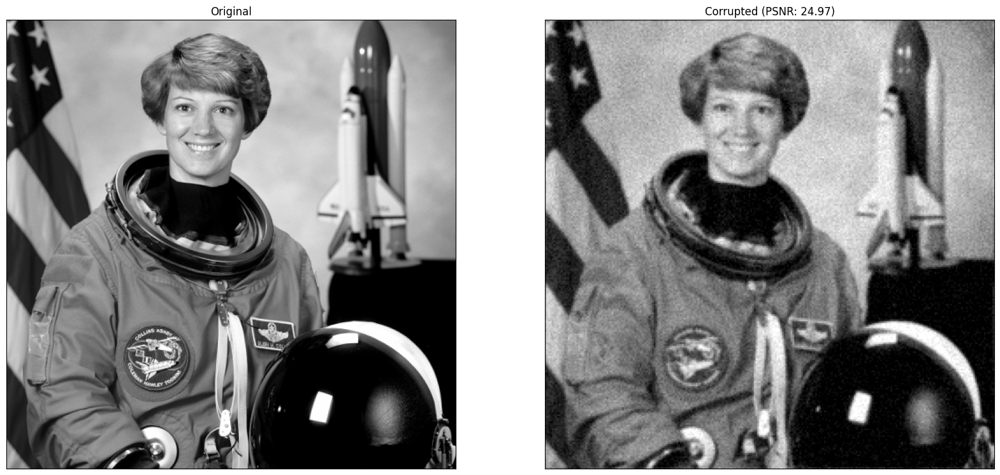

In [14]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, metrics
from scipy import signal
from numpy import fft

# Immagine in floating point con valori tra 0 e 1
X = rgb2gray(data.astronaut()).astype(np.float64)
m, n = X.shape

sf = 2
# Genera il filtro di blur
k = gaussian_kernel(5, 1)
plt.imshow(k)
plt.show()

#X_blurred = A(X, K, sf)

#Blur with FFT
K = psf_fft(k, 5, X.shape)
plt.imshow(np.abs(K))
plt.show()

X_blurred = A(X, K, sf)

# Blur with openCV
#X_blurred = cv.filter2D(X, -1, k)
plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title('Original')
#plt.xticks([]), plt.yticks([])
plt.subplot(122).imshow(X_blurred, cmap='gray', vmin=0, vmax=1)
plt.title('Downsampled')
#plt.xticks([]), plt.yticks([])
plt.show()


# Genera il rumore
sigma = 0.04
np.random.seed(42)
noise = np.random.normal(size=X_blurred.shape, scale = sigma)

# Aggiungi blur e rumore
y = X_blurred + noise
ATy = AT(y, K, sf) #AT = AT ST


plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title('Original')
#plt.xticks([]), plt.yticks([])
plt.subplot(122).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title('Corrupted')
#plt.xticks([]), plt.yticks([])
plt.show()

PSNR = metrics.peak_signal_noise_ratio(X, ATy)
mse = metrics.mean_squared_error(X, ATy)



# Visualizziamo i risultati
plt.figure(figsize=(20, 10))
plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title(f'Corrupted (PSNR: {PSNR:.2f})')
plt.xticks([]), plt.yticks([])
plt.show()

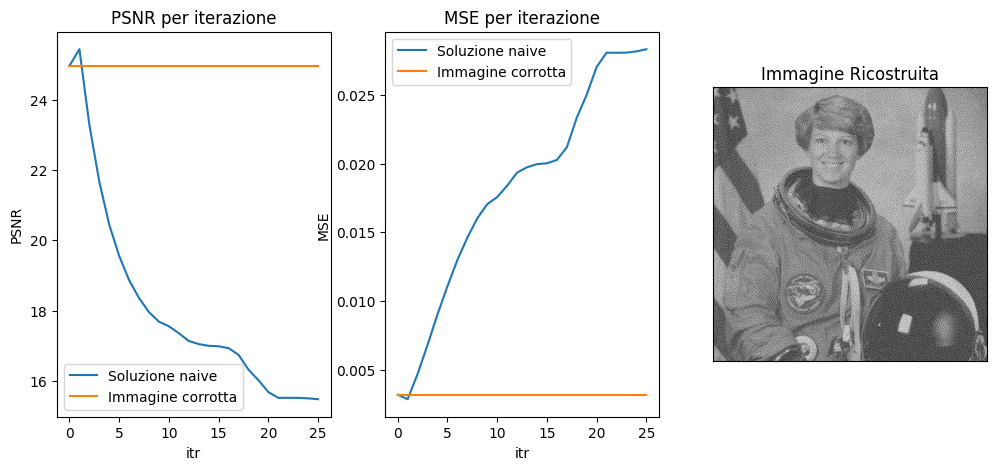

In [15]:
# Soluzione naive
from scipy.optimize import minimize

# Funzione da minimizzare
def f(x):
    x = x.reshape((m, n))
    Ax = A(x, K, sf)
    return 0.5 * np.sum(np.square(Ax - y))

# Gradiente della funzione da minimizzare
def df(x):
    x = x.reshape((m, n))
    ATAx = AT(A(x,K,sf),K, sf)
    d = ATAx - ATy
    return d.reshape(m * n)

# Minimizzazione della funzione
x0 = ATy.reshape(m*n)
max_iter = 25
res = minimize(f, x0, method='CG', jac=df, options={'maxiter':max_iter, 'return_all':True})

PSNR = np.zeros(max_iter + 1)
MSE = np.zeros(max_iter + 1)
for k, x_k in enumerate(res.allvecs):
    PSNR[k] = metrics.peak_signal_noise_ratio(X, x_k.reshape(X.shape))
    MSE[k] = metrics.mean_squared_error(X, x_k.reshape(X.shape))

# Risultato della minimizzazione
X_res = res.x.reshape((m, n))

# PSNR dell'immagine corrotta rispetto all'oginale
starting_PSNR = np.full(PSNR.shape[0], metrics.peak_signal_noise_ratio(X, ATy))
starting_MSE = np.full(MSE.shape[0], metrics.mean_squared_error(X, ATy))

# Visualizziamo i risultati
plt.subplots(1,3, figsize=((12,5)))
ax2 = plt.subplot(1, 3, 1)
ax2.plot(PSNR, label="Soluzione naive")
ax2.plot(starting_PSNR, label="Immagine corrotta")
plt.legend()
plt.title('PSNR per iterazione')
plt.ylabel("PSNR")
plt.xlabel('itr')
ax3 = plt.subplot(1, 3, 2)
ax3.plot(MSE, label="Soluzione naive")
ax3.plot(starting_MSE, label="Immagine corrotta")
plt.legend()
plt.title('MSE per iterazione')
plt.ylabel("MSE")
plt.xlabel('itr')
plt.subplot(1, 3, 3).imshow(X_res, cmap='gray')
plt.title('Immagine Ricostruita')
plt.xticks([]), plt.yticks([])
plt.show()

PSNR: 16.7762 (λBB = 0.00200)
MSE: 0.02100769 (λBB = 0.0020)
PSNR: 19.1082 (λBB = 0.00500)
MSE: 0.01227941 (λBB = 0.0050)
PSNR: 23.2013 (λBB = 0.01000)
MSE: 0.00478487 (λBB = 0.0100)
PSNR: 25.0876 (λBB = 0.02000)
MSE: 0.00309914 (λBB = 0.0200)
PSNR: 24.7594 (λBB = 0.03000)
MSE: 0.00334238 (λBB = 0.0300)


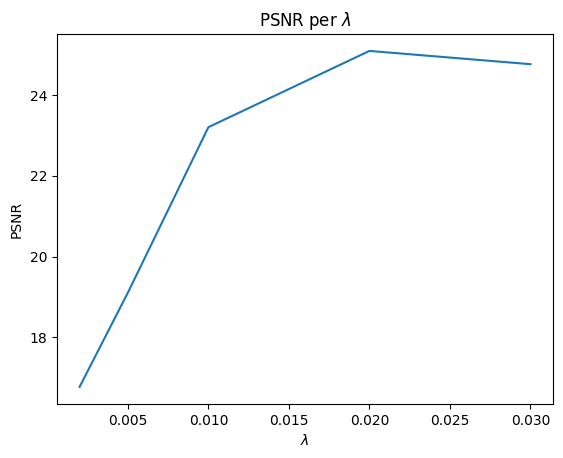

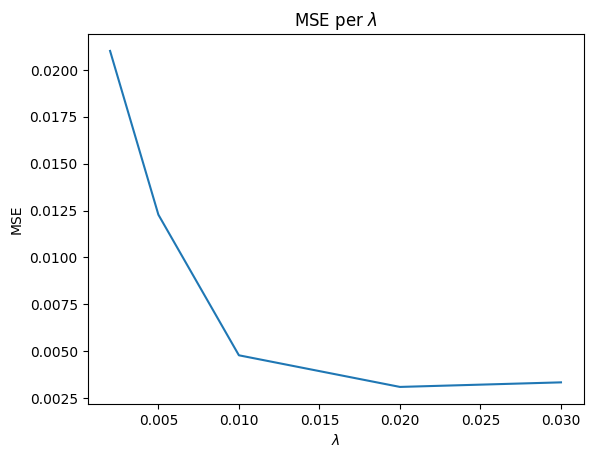

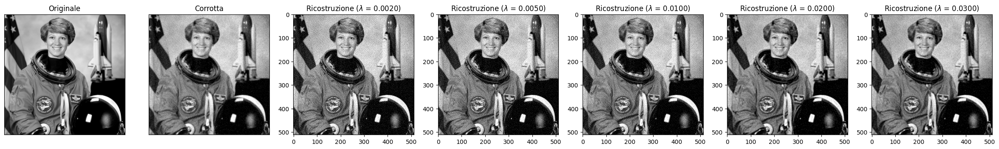

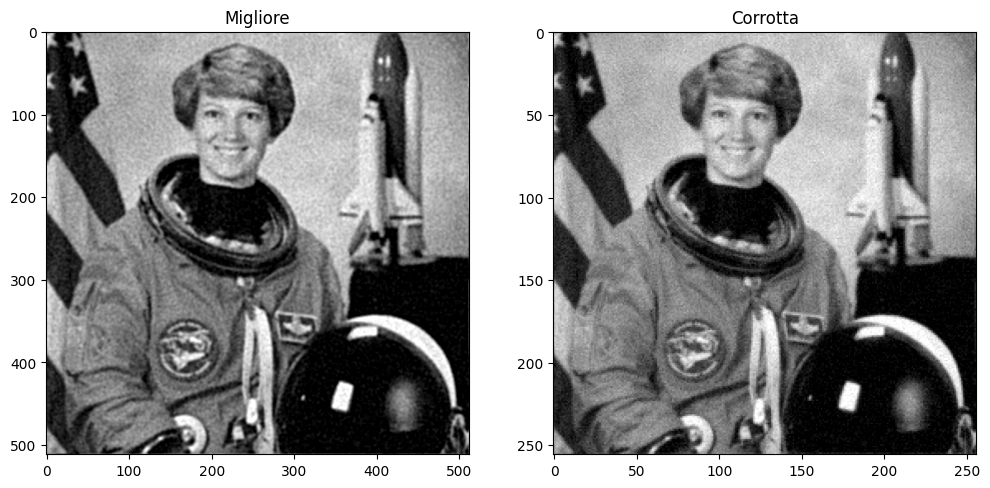

In [16]:
# Regolarizzazione
# Funzione da minimizzare
def f(x, L):
    nsq = np.sum(np.square(x))
    x  = x.reshape((m, n))
    Ax = A(x, K, sf)
    return 0.5 * np.sum(np.square(Ax - y)) + 0.5 * L * nsq

# Gradiente della funzione da minimizzare
def df(x, L):
    Lx = L * x
    x = x.reshape(m, n)
    ATAx = AT(A(x,K,sf),K,sf)
    d = ATAx - ATy
    return d.reshape(m * n) + Lx

x0 = ATy.reshape(m*n)
lambdas = [0.002,0.005,0.01,0.02,0.03]
PSNRs = []
MSEs = []
images = []

# Ricostruzione per diversi valori del parametro di regolarizzazione
for i, L in enumerate(lambdas):
    # Esegui la minimizzazione con al massimo 50 iterazioni
    max_iter = 50
    res = minimize(f, x0, (L), method='CG', jac=df, options={'maxiter':max_iter})

    # Aggiungi la ricostruzione nella lista images
    X_curr = res.x.reshape(X.shape)
    images.append(X_curr)

    # Stampa il PSNR per il valore di lambda attuale
    PSNR = metrics.peak_signal_noise_ratio(X, X_curr)
    PSNRs.append(PSNR)
    MSEs.append(metrics.mean_squared_error(X, X_curr))
    print(f'PSNR: {PSNR:.4f} (\u03BBBB = {L:.5f})')
    print(f'MSE: {metrics.mean_squared_error(X, X_curr):.8f} (\u03BBBB = {L:.4f})')



# Visualizziamo i risultati
plt.plot(lambdas,PSNRs)
plt.title('PSNR per $\lambda$')
plt.ylabel("PSNR")
plt.xlabel('$\lambda$')
plt.show()

plt.plot(lambdas,MSEs)
plt.title('MSE per $\lambda$')
plt.ylabel("MSE")
plt.xlabel('$\lambda$')
plt.show()

plt.figure(figsize=(30, 10))

plt.subplot(1, len(lambdas) + 2, 1).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title("Originale")
plt.xticks([]), plt.yticks([])
plt.subplot(1, len(lambdas) + 2, 2).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title("Corrotta")
plt.xticks([]), plt.yticks([])


for i, L in enumerate(lambdas):
  plt.subplot(1, len(lambdas) + 2, i + 3).imshow(images[i], cmap='gray', vmin=0, vmax=1)
  plt.title(f"Ricostruzione ($\lambda$ = {L:.4f})")
plt.show()

plt.figure(figsize=(12, 8))
plt.subplot(1,2,1).imshow(images[np.argmax(PSNRs)], cmap='gray', vmin=0, vmax=1)
plt.title("Migliore")
plt.subplot(1, 2, 2).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title("Corrotta")
plt.show()

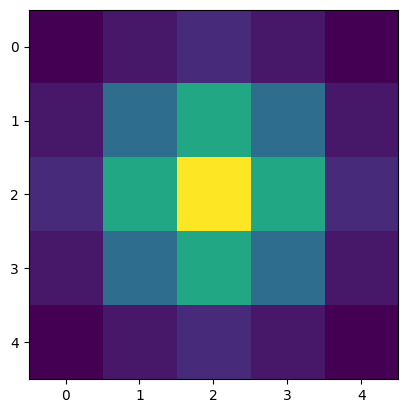

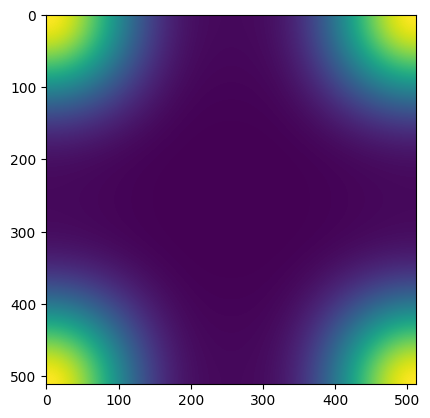

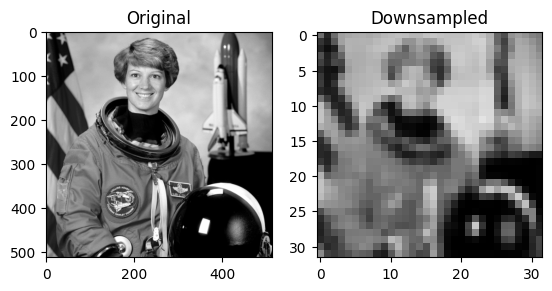

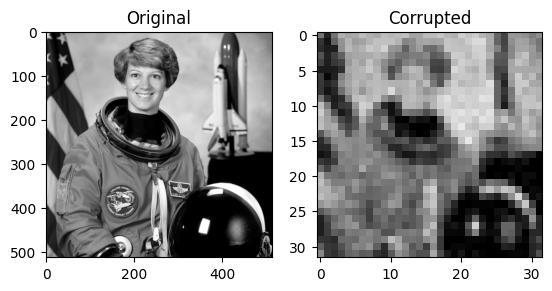

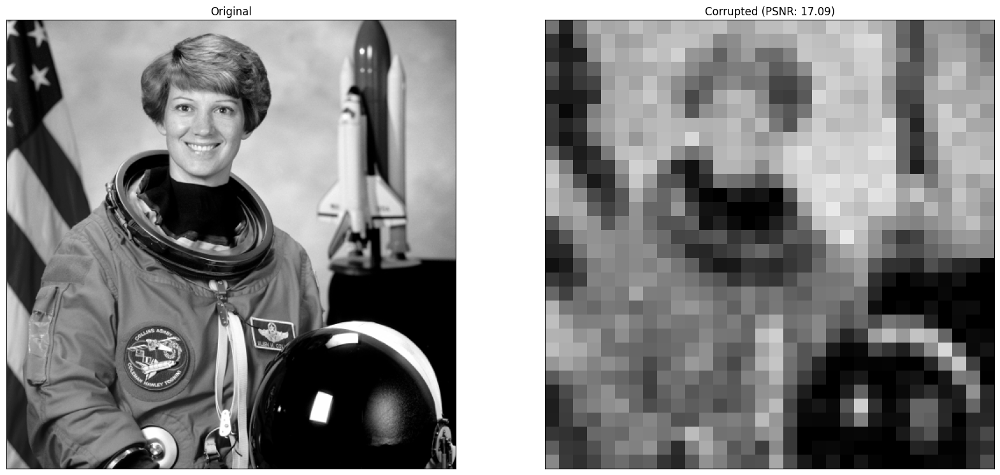

In [17]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, metrics
from scipy import signal
from numpy import fft

# Immagine in floating point con valori tra 0 e 1
X = rgb2gray(data.astronaut()).astype(np.float64)
m, n = X.shape

sf = 16
# Genera il filtro di blur
k = gaussian_kernel(5, 1)
plt.imshow(k)
plt.show()

#X_blurred = A(X, K, sf)

#Blur with FFT
K = psf_fft(k, 5, X.shape)
plt.imshow(np.abs(K))
plt.show()

X_blurred = A(X, K, sf)

# Blur with openCV
#X_blurred = cv.filter2D(X, -1, k)
plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title('Original')
#plt.xticks([]), plt.yticks([])
plt.subplot(122).imshow(X_blurred, cmap='gray', vmin=0, vmax=1)
plt.title('Downsampled')
#plt.xticks([]), plt.yticks([])
plt.show()


# Genera il rumore
sigma = 0.04
np.random.seed(42)
noise = np.random.normal(size=X_blurred.shape, scale = sigma)

# Aggiungi blur e rumore
y = X_blurred + noise
ATy = AT(y, K, sf) #AT = AT ST


plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title('Original')
#plt.xticks([]), plt.yticks([])
plt.subplot(122).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title('Corrupted')
#plt.xticks([]), plt.yticks([])
plt.show()

PSNR = metrics.peak_signal_noise_ratio(X, ATy)
mse = metrics.mean_squared_error(X, ATy)



# Visualizziamo i risultati
plt.figure(figsize=(20, 10))
plt.subplot(121).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title(f'Corrupted (PSNR: {PSNR:.2f})')
plt.xticks([]), plt.yticks([])
plt.show()

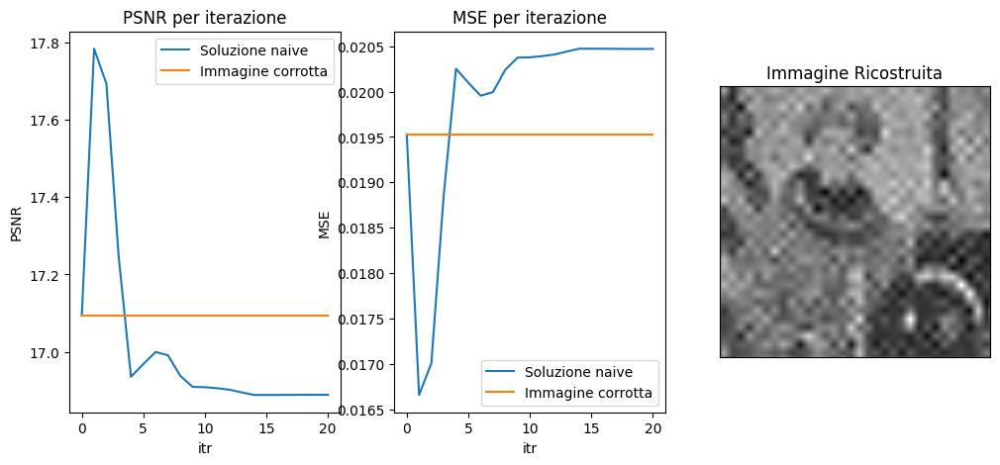

In [20]:
# Soluzione naive
from scipy.optimize import minimize

# Funzione da minimizzare
def f(x):
    x = x.reshape((m, n))
    Ax = A(x, K, sf)
    return 0.5 * np.sum(np.square(Ax - y))

# Gradiente della funzione da minimizzare
def df(x):
    x = x.reshape((m, n))
    ATAx = AT(A(x,K,sf),K, sf)
    d = ATAx - ATy
    return d.reshape(m * n)

# Minimizzazione della funzione
x0 = ATy.reshape(m*n)
max_iter = 20
res = minimize(f, x0, method='CG', jac=df, options={'maxiter':max_iter, 'return_all':True})

PSNR = np.zeros(max_iter + 1)
MSE = np.zeros(max_iter + 1)
for k, x_k in enumerate(res.allvecs):
    PSNR[k] = metrics.peak_signal_noise_ratio(X, x_k.reshape(X.shape))
    MSE[k] = metrics.mean_squared_error(X, x_k.reshape(X.shape))

# Risultato della minimizzazione
X_res = res.x.reshape((m, n))

# PSNR dell'immagine corrotta rispetto all'oginale
starting_PSNR = np.full(PSNR.shape[0], metrics.peak_signal_noise_ratio(X, ATy))
starting_MSE = np.full(MSE.shape[0], metrics.mean_squared_error(X, ATy))

# Visualizziamo i risultati
plt.subplots(1,3, figsize=((12,5)))
ax2 = plt.subplot(1, 3, 1)
ax2.plot(PSNR, label="Soluzione naive")
ax2.plot(starting_PSNR, label="Immagine corrotta")
plt.legend()
plt.title('PSNR per iterazione')
plt.ylabel("PSNR")
plt.xlabel('itr')
ax3 = plt.subplot(1, 3, 2)
ax3.plot(MSE, label="Soluzione naive")
ax3.plot(starting_MSE, label="Immagine corrotta")
plt.legend()
plt.title('MSE per iterazione')
plt.ylabel("MSE")
plt.xlabel('itr')
plt.subplot(1, 3, 3).imshow(X_res, cmap='gray')
plt.title('Immagine Ricostruita')
plt.xticks([]), plt.yticks([])
plt.show()

PSNR: 17.0932 (λBB = 0.02000)
MSE: 0.01952912 (λBB = 0.0200)
PSNR: 17.7039 (λBB = 0.03000)
MSE: 0.01696729 (λBB = 0.0300)
PSNR: 17.6377 (λBB = 0.04000)
MSE: 0.01722767 (λBB = 0.0400)
PSNR: 17.1937 (λBB = 0.10000)
MSE: 0.01908228 (λBB = 0.1000)


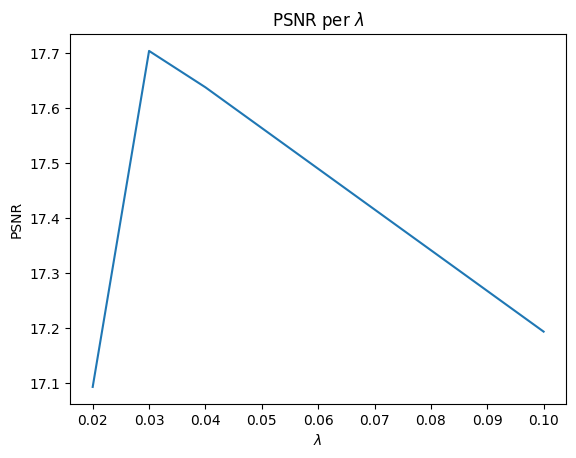

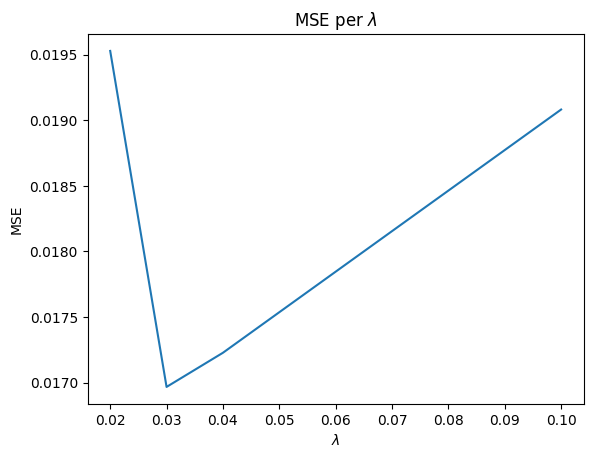

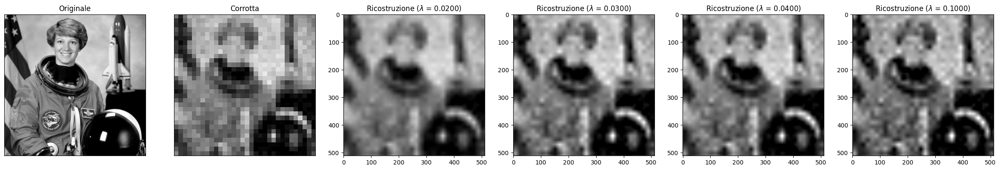

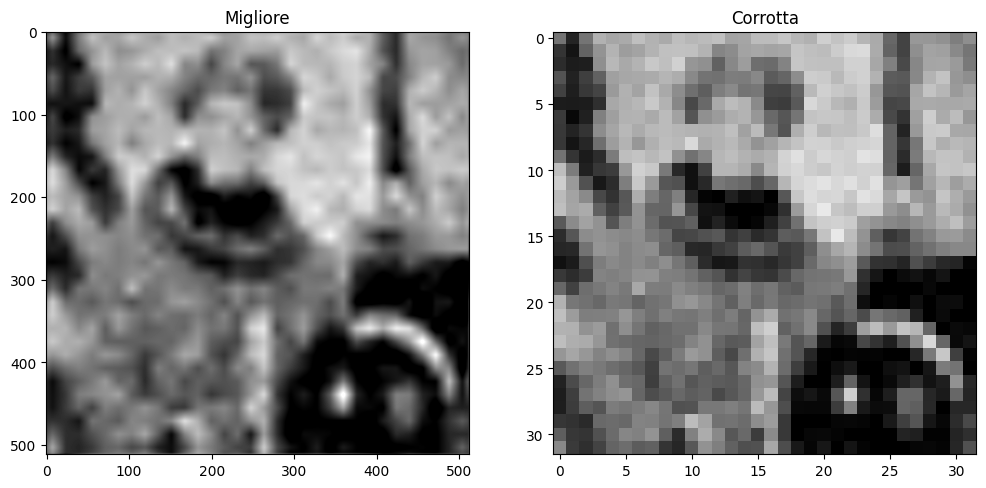

In [21]:
# Regolarizzazione
# Funzione da minimizzare
def f(x, L):
    nsq = np.sum(np.square(x))
    x  = x.reshape((m, n))
    Ax = A(x, K, sf)
    return 0.5 * np.sum(np.square(Ax - y)) + 0.5 * L * nsq

# Gradiente della funzione da minimizzare
def df(x, L):
    Lx = L * x
    x = x.reshape(m, n)
    ATAx = AT(A(x,K,sf),K,sf)
    d = ATAx - ATy
    return d.reshape(m * n) + Lx

x0 = ATy.reshape(m*n)
lambdas = [0.02,0.03,0.04,0.1]
PSNRs = []
MSEs = []
images = []

# Ricostruzione per diversi valori del parametro di regolarizzazione
for i, L in enumerate(lambdas):
    # Esegui la minimizzazione con al massimo 50 iterazioni
    max_iter = 50
    res = minimize(f, x0, (L), method='CG', jac=df, options={'maxiter':max_iter})

    # Aggiungi la ricostruzione nella lista images
    X_curr = res.x.reshape(X.shape)
    images.append(X_curr)

    # Stampa il PSNR per il valore di lambda attuale
    PSNR = metrics.peak_signal_noise_ratio(X, X_curr)
    PSNRs.append(PSNR)
    MSEs.append(metrics.mean_squared_error(X, X_curr))
    print(f'PSNR: {PSNR:.4f} (\u03BBBB = {L:.5f})')
    print(f'MSE: {metrics.mean_squared_error(X, X_curr):.8f} (\u03BBBB = {L:.4f})')



# Visualizziamo i risultati
plt.plot(lambdas,PSNRs)
plt.title('PSNR per $\lambda$')
plt.ylabel("PSNR")
plt.xlabel('$\lambda$')
plt.show()

plt.plot(lambdas,MSEs)
plt.title('MSE per $\lambda$')
plt.ylabel("MSE")
plt.xlabel('$\lambda$')
plt.show()

plt.figure(figsize=(30, 10))

plt.subplot(1, len(lambdas) + 2, 1).imshow(X, cmap='gray', vmin=0, vmax=1)
plt.title("Originale")
plt.xticks([]), plt.yticks([])
plt.subplot(1, len(lambdas) + 2, 2).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title("Corrotta")
plt.xticks([]), plt.yticks([])


for i, L in enumerate(lambdas):
  plt.subplot(1, len(lambdas) + 2, i + 3).imshow(images[i], cmap='gray', vmin=0, vmax=1)
  plt.title(f"Ricostruzione ($\lambda$ = {L:.4f})")
plt.show()

plt.figure(figsize=(12, 8))
plt.subplot(1,2,1).imshow(images[np.argmax(PSNRs)], cmap='gray', vmin=0, vmax=1)
plt.title("Migliore")
plt.subplot(1, 2, 2).imshow(y, cmap='gray', vmin=0, vmax=1)
plt.title("Corrotta")
plt.show()